# Lead Scoring -> An assignment for Logistic Regression
### Group Members Name : Sujith Chandrasekaran & Karthik Manoharan
<font color = Red >==========================================================================================</font>

### Problem Statement:
An education company named X Education sells online courses to industry professionals. Although X Education gets a lot of leads, its lead conversion rate is very poor. This results in saleforse spending futile effort in contacting many Applicants who are not actually going to join the Course thereby wasting time and effort.

### Business Goal:

Build a logistic regression model to assign a lead score between 0 and 100 to each of the leads which can be used by the company to target potential leads. A higher score would mean that the lead is hot, i.e. is most likely to convert whereas a lower score would mean that the lead is cold and will mostly not get converted.

Note: When people fill up a form providing their Contact details, they are classified as lead

###### Steps involved
    Step1: Read and Understand data: 
            1.1 Read data
            1.2 Understand data 
    Step2: Remove the Sales Team generated columns in the dataframe
    Step3: Clean Data: 
            3.1 Analys Unique categories of the Variables and 
                   remove if you see
                    3.1.1 Variable having only one category
                    3.1.2 Skewness towards one category
            3.2 Handle "Select" & NaN present in Categorical Variables
            3.3 Group categories if you see many categoroes that are very small in percentage
            3.4 Understand and Clean Numerical Varaibles
            3.5 Drop Variables that have missing values above 50%     
            3.6 Analyse each row and drop if you see 50% data is not populated for that Lead
    Step4: Data Preparation: 
            4.1 Convert Binary Yes / No to 0 and 1, 
            4.2 Create dummies
            4.3 Outliet Treatment
            4.4 Perform Test Train split
    Step5: Feature Scaling
    Step6: Model Building using 2 approaches: 
            6.1 Feature Selection using RFE
            6.2 Assessing the model with StatsModels  and Build Model iteratively
    Step7: Model Accuracy, Sensitivity Calculation.
    Step8: Finding Optimal Cutoff 
    Step9: Making predictions on the test set
    Step10: Choose one of the models built

## <font color = Red>Step 1: Read and Understand data</font>
### 1.1 Read Data

In [1145]:
# Supress the warnings
import warnings
warnings.filterwarnings('ignore')

In [1146]:
# import numpy and pandas Libraries
import numpy as np
import pandas as pd

In [1147]:
# import Graph libraries
import seaborn as sns
import matplotlib.pyplot as plt

In [1148]:
# Read the Data
Leads= pd.read_csv("Leads.csv")

In [1149]:
### Data Dictionary 
# Variables	                                  Description
# Prospect ID	                                  A unique ID with which the customer is identified.
# Lead Number	                                  A lead number assigned to each lead procured.
# Lead Origin	                                  The origin identifier with which the customer was identified to be a lead. Includes API, Landing Page Submission, etc.
# Lead Source	                                  The source of the lead. Includes Google, Organic Search, Olark Chat, etc.
# Do Not Emai	                                  An indicator variable selected by the customer wherein they select whether of not they want to be emailed about the course or not.
# Do Not Call	                                  An indicator variable selected by the customer wherein they select whether of not they want to be called about the course or not.
# Converted	                                      The target variable. Indicates whether a lead has been successfully converted or not.
# TotalVisits	                                  The total number of visits made by the customer on the website.
# Total Time Spent on Website	                  The total time spent by the customer on the website.
# Page Views Per Visit	                          Average number of pages on the website viewed during the visits.
# Last Activity	                                  Last activity performed by the customer. Includes Email Opened, Olark Chat Conversation, etc.
# Country	                                      The country of the customer.
# Specialization	                              The industry domain in which the customer worked before. Includes the level 'Select Specialization' which means the customer had not selected this option while filling the form.
# How did you hear about X Education	          The source from which the customer heard about X Education.
# What is your current occupation	              Indicates whether the customer is a student, umemployed or employed.
# What matters most to you in choosing this course	An option selected by the customer indicating what is their main motto behind doing this course.
# Search	                                      Indicating whether the customer had seen the ad in any of the listed items.
# Magazine	                                      Indicating whether the customer had seen the ad in any of the listed items.
# Newspaper Article	                              Indicating whether the customer had seen the ad in any of the listed items.
# X Education Forums	                          Indicating whether the customer had seen the ad in any of the listed items.
# Newspaper	                                      Indicating whether the customer had seen the ad in any of the listed items.
# Digital Advertisement	                          Indicating whether the customer had seen the ad in any of the listed items.
# Through Recommendations	                      Indicates whether the customer came in through recommendations.
# Receive More Updates About Our Courses	      Indicates whether the customer chose to receive more updates about the courses.
# Tags	                                          Tags assigned to customers indicating the current status of the lead.
# Lead Quality	                                  Indicates the quality of lead based on the data and intuition the the employee who has been assigned to the lead.
# Update me on Supply Chain Content	              Indicates whether the customer wants updates on the Supply Chain Content.
# Get updates on DM Content	                      Indicates whether the customer wants updates on the DM Content.
# Lead Profile	                                  A lead level assigned to each customer based on their profile.
# City	                                          The city of the customer.
# Asymmetrique Activity Index	                  An index and score assigned to each customer based on their activity and their profile
# Asymmetrique Profile Index	                  An index and score assigned to each customer based on their activity and their profile
# Asymmetrique Activity Score	                  An index and score assigned to each customer based on their activity and their profile
# Asymmetrique Profile Score	                  An index and score assigned to each customer based on their activity and their profile
# I agree to pay the amount through cheque	      Indicates whether the customer has agreed to pay the amount through cheque or not.
# a free copy of Mastering The Interview	      Indicates whether the customer wants a free copy of 'Mastering the Interview' or not.
# Last Notable Activity	                          The last notable acitivity performed by the student.

#### Converted -> The target variable. Indicates whether a lead has been successfully converted or not.

### 1.2 Understand Data (EDA)

In [1150]:
Leads.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [1151]:
# Let's check the dimensions of the dataframe
Leads.shape

(9240, 37)

In [1152]:
# let's look at the statistical aspects of the dataframe
Leads.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [1153]:
# Let's see the type of each column
Leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

`I.1-> Inference:`<br>
<font color=Blue> The below 2 are found to be id variable and hence not needed for analysis <br>
    1) Prospect ID <br>
    2) Lead Number <br>
    The below variables are added by the sales team and and hence not needed for analysis as <br>
    the model is needed to be run prior to the Sales team adding the below data:
    1) Last Activity <br>
    2) Tags <br>
    3) Lead Quality <br>
    4) Lead Profile <br>
    5) Asymmetrique Activity Index <br>
    6) Asymmetrique Profile Index <br>
    7) Asymmetrique Activity Score <br>
    8) Asymmetrique Profile Score <br>
    9) Last Notable Activity <br>
    </font>

## <font color = Red> Step2: Remove the Sales Team generated columns in the dataframe </font>

In [1154]:
# drop ID Variables and the data generated by Sales team 
dropvar =['Prospect ID','Lead Number','Last Activity','Tags','Lead Quality','Lead Profile','Asymmetrique Activity Index','Asymmetrique Profile Index',
'Asymmetrique Activity Score','Asymmetrique Profile Score','Last Notable Activity']
Leads.drop( dropvar , axis=1, inplace=True)
Leads.shape

(9240, 26)

## <font color = Red> Step3: Clean Data: </font>



### 3.1 Analys Unique categories of the Variables

In [1155]:
dtypes= Leads.dtypes
unique_count = Leads.nunique(dropna=False)
catAnalysis = pd.concat([dtypes, unique_count], axis=1)
catAnalysis.rename(columns = { 0: 'dtypes', 1 : 'uniqueVal'}, inplace = True)
catAnalysis.sort_values(by='uniqueVal', ascending= False)

,dtypes,uniqueVal
Total Time Spent on Website,int64,1731
Page Views Per Visit,float64,115
TotalVisits,float64,42
Country,object,39
Lead Source,object,22
Specialization,object,20
How did you hear about X Education,object,11
City,object,8
What is your current occupation,object,7
Lead Origin,object,5


`I.2-> Inference:`<br>
<font color=Blue> The below variables have only 1 category and hence can be dropped <br>
    1)'Magazine', <br>
    2)'Receive More Updates About Our Courses',<br>
    3)'Update me on Supply Chain Content',<br>
    4)'Get updates on DM Content',<br>
    4)'I agree to pay the amount through cheque',<br>
    <br>
    The below variables are Binary category <br>
    1)'X Education Forums',   <br>
    2)'Through Recommendations',   <br>
    3)'Digital Advertisement',   <br>
    4)'Newspaper',   <br>
    5)'Search',   <br>
    6)'Newspaper Article',   <br>
    7)'Converted',   <br>
    8)'Do Not Call',   <br>
    9)'Do Not Email',   <br>
    10)'A free copy of Mastering The Interview'   <br>
    </font>

### 3.1.1 Variable having only one category

In [1156]:
# drop Variables  
dropvar =['Magazine',
'Receive More Updates About Our Courses',
'Update me on Supply Chain Content',
'Get updates on DM Content',
'I agree to pay the amount through cheque'
]
Leads.drop( dropvar , axis=1, inplace=True)
Leads.shape

(9240, 21)

In [1157]:
binaryVar=['X Education Forums',
'Through Recommendations',
'Digital Advertisement',
'Newspaper',
'Search',
'Newspaper Article',
'Converted',
'Do Not Call',
'Do Not Email',
'A free copy of Mastering The Interview']
print(binaryVar)

['X Education Forums', 'Through Recommendations', 'Digital Advertisement', 'Newspaper', 'Search', 'Newspaper Article', 'Converted', 'Do Not Call', 'Do Not Email', 'A free copy of Mastering The Interview']


In [1158]:
# Binary variables analysis:

for var in binaryVar:
    print (round(Leads[var].value_counts(dropna= False, normalize=True),1) * 100)

No     100.0
Yes      0.0
Name: X Education Forums, dtype: float64
No     100.0
Yes      0.0
Name: Through Recommendations, dtype: float64
No     100.0
Yes      0.0
Name: Digital Advertisement, dtype: float64
No     100.0
Yes      0.0
Name: Newspaper, dtype: float64
No     100.0
Yes      0.0
Name: Search, dtype: float64
No     100.0
Yes      0.0
Name: Newspaper Article, dtype: float64
0    60.0
1    40.0
Name: Converted, dtype: float64
No     100.0
Yes      0.0
Name: Do Not Call, dtype: float64
No     90.0
Yes    10.0
Name: Do Not Email, dtype: float64
No     70.0
Yes    30.0
Name: A free copy of Mastering The Interview, dtype: float64


`I.3-> Inference:`<br>
<font color=Blue> The below variables are highly skewed and hence can be dropped <br>
1) X Education Forums<br>
2) Through Recommendations<br>
3) Digital Advertisement<br>
4) Newspaper<br>
5) Search<br>
6) Newspaper Article<br>
7) Do Not Call<br>
    </font>

### 3.1.2 Remlove Variable having Skewness towards one catagory

In [1159]:
dropvar =['X Education Forums',
'Through Recommendations',
'Digital Advertisement',
'Newspaper',
'Search',
'Newspaper Article',
'Do Not Call'
]
Leads.drop( dropvar , axis=1, inplace=True)
Leads.shape

(9240, 14)

### 3.2 Handle "Select" & NaN present in Categorical Variables

In [1160]:
# other Categorical Variable Analysis

catVarOther=['Country',
'Lead Source',
'Specialization',
'How did you hear about X Education',
'City',
'What is your current occupation',
'Lead Origin',
'What matters most to you in choosing a course']
print(catVarOther)


['Country', 'Lead Source', 'Specialization', 'How did you hear about X Education', 'City', 'What is your current occupation', 'Lead Origin', 'What matters most to you in choosing a course']


In [1161]:
for var in catVarOther:
    print ("Value count of",var,"\n",round(Leads[var].value_counts(dropna=False,normalize=True),2) * 100,"\n")

Value count of Country 
 India                   70.0
NaN                     27.0
United States            1.0
United Arab Emirates     1.0
Singapore                0.0
Saudi Arabia             0.0
United Kingdom           0.0
Australia                0.0
Qatar                    0.0
Hong Kong                0.0
Bahrain                  0.0
Oman                     0.0
France                   0.0
unknown                  0.0
South Africa             0.0
Kuwait                   0.0
Germany                  0.0
Nigeria                  0.0
Canada                   0.0
Sweden                   0.0
Philippines              0.0
Belgium                  0.0
Bangladesh               0.0
Italy                    0.0
Netherlands              0.0
China                    0.0
Uganda                   0.0
Asia/Pacific Region      0.0
Ghana                    0.0
Sri Lanka                0.0
Kenya                    0.0
Vietnam                  0.0
Indonesia                0.0
Denmark           

`I.4-> Inference:`<br>
<font color=Blue> The Country variables is highly skewed and hence can be dropped <br>
    </font>

In [1162]:
dropvar =['Country']
Leads.drop( dropvar , axis=1, inplace=True)
Leads.shape

catVarOther=[
'Lead Source',
'Specialization',
'How did you hear about X Education',
'City',
'What is your current occupation',
'Lead Origin',
'What matters most to you in choosing a course']
print(catVarOther)

['Lead Source', 'Specialization', 'How did you hear about X Education', 'City', 'What is your current occupation', 'Lead Origin', 'What matters most to you in choosing a course']


`I.5-> Inference:`<br>
<font color=Blue> The Country below variables have "Select" and "Nan". This needs to be treated to have one value as "Others" <br>
    1) 'Specialization',<br>
    2) 'How did you hear about X Education',<br>
    3) 'City',<br>
    4) 'What is your current occupation',<br>
    5) 'What matters most to you in choosing a course',<br>
    6) 'Lead Source'<br>
    </font>

In [1163]:
Leads["Lead Source"] = Leads["Lead Source"].replace(["Select"],["Other"])
Leads["Specialization"] = Leads["Specialization"].replace(["Select"],["Other"])
Leads["How did you hear about X Education"] = Leads["How did you hear about X Education"].replace(["Select"],["Other"])
Leads["City"] = Leads["City"].replace(["Select"],["Other"])
Leads["What is your current occupation"] = Leads["What is your current occupation"].replace(["Select"],["Other"])
Leads["What matters most to you in choosing a course"] = Leads["What matters most to you in choosing a course"].replace(["Select"],["Others"])

Leads = Leads.fillna(value={'Specialization': "Other" , 'How did you hear about X Education': "Other",
                            'City': "Other", 'What is your current occupation': "Other",
                               'What matters most to you in choosing a course': "Other",
                           'Lead Source': "Other"})

for var in catVarOther:
    print ("Value count of",var,"\n",round(Leads[var].value_counts(dropna=False,normalize=True),2) * 100,"\n")

Value count of Lead Source 
 Google               31.0
Direct Traffic       28.0
Olark Chat           19.0
Organic Search       12.0
Reference             6.0
Welingak Website      2.0
Referral Sites        1.0
Facebook              1.0
Other                 0.0
bing                  0.0
google                0.0
Click2call            0.0
Social Media          0.0
Live Chat             0.0
Press_Release         0.0
Pay per Click Ads     0.0
NC_EDM                0.0
blog                  0.0
WeLearn               0.0
welearnblog_Home      0.0
youtubechannel        0.0
testone               0.0
Name: Lead Source, dtype: float64 

Value count of Specialization 
 Other                                37.0
Finance Management                   11.0
Human Resource Management             9.0
Marketing Management                  9.0
Operations Management                 5.0
Business Administration               4.0
IT Projects Management                4.0
Supply Chain Management              

`I.6-> Inference:`<br>
<font color=Blue> 
The Variable "Lead Source" has values which are very less frequenty occuring in the data and hence they are <br>
group as "Other". <br>
    1 Others <br>
    2 bing <br>
    3 google <br>
    4 Click2call <br>
    5 Live Chat <br>
    6 Press_Release <br>
    7  Social Media <br>
    8 NC_EDM <br>
    9 youtubechannel <br>
    10 welearnblog_Home <br>
    11 testone <br>
    12 blog <br>
    13 WeLearn <br>
    14  Pay per Click Ads <br>

The Variable "Specialization" has values which are very less frequenty occuring in the data and hence they are <br>
group as "Other". <br>
    1 'Hospitality Management', <br>
    2 'E-COMMERCE', <br>
    3 'Retail Management', <br>
    4 'Rural and Agribusiness', <br>
    5 'E-Business', <br>
    6 'Services Excellence', <br>
</font>

### 3.3 Group categories if you see many categoroes that are very small in percentage

In [1164]:
Leads["Lead Source"] = Leads["Lead Source"].replace(['Others','bing','google','Click2call','Live Chat','Press_Release',
                                                     'Social Media','NC_EDM','youtubechannel','welearnblog_Home',
                                                     'Pay per Click Ads','testone','blog','WeLearn'],
                                                    ["Other","Other","Other","Other","Other","Other","Other","Other",
                                                     "Other","Other","Other","Other","Other","Other"])

Leads["Specialization"] = Leads["Specialization"].replace(['Hospitality Management','E-COMMERCE','Retail Management',
'Rural and Agribusiness','E-Business','Services Excellence'],["Other","Other","Other","Other","Other","Other"])


In [1165]:
for var in catVarOther:
    print ("Value count of",var,"\n",round(Leads[var].value_counts(dropna=False,normalize=True),2) * 100,"\n")

Value count of Lead Source 
 Google              31.0
Direct Traffic      28.0
Olark Chat          19.0
Organic Search      12.0
Reference            6.0
Welingak Website     2.0
Referral Sites       1.0
Other                1.0
Facebook             1.0
Name: Lead Source, dtype: float64 

Value count of Specialization 
 Other                                42.0
Finance Management                   11.0
Human Resource Management             9.0
Marketing Management                  9.0
Operations Management                 5.0
Business Administration               4.0
IT Projects Management                4.0
Supply Chain Management               4.0
Banking, Investment And Insurance     4.0
Travel and Tourism                    2.0
Media and Advertising                 2.0
International Business                2.0
Healthcare Management                 2.0
Name: Specialization, dtype: float64 

Value count of How did you hear about X Education 
 Other                    80.0
Online Sear

In [1166]:
dtypes= Leads.dtypes
unique_count = Leads.nunique(dropna=False)
catAnalysis = pd.concat([dtypes, unique_count], axis=1)
catAnalysis.rename(columns = { 0: 'dtypes', 1 : 'uniqueVal'}, inplace = True)
catAnalysis.sort_values(by='uniqueVal', ascending= False)

,dtypes,uniqueVal
Total Time Spent on Website,int64,1731
Page Views Per Visit,float64,115
TotalVisits,float64,42
Specialization,object,13
Lead Source,object,9
How did you hear about X Education,object,9
City,object,7
What is your current occupation,object,6
Lead Origin,object,5
What matters most to you in choosing a course,object,3


### 3.5 Drop Variables that have missing values above 50%  

In [1167]:
round((Leads.isnull().sum())/(Leads.shape[0])*100,2)
# Leads.isnull().sum()

Lead Origin                                      0.00
Lead Source                                      0.00
Do Not Email                                     0.00
Converted                                        0.00
TotalVisits                                      1.48
Total Time Spent on Website                      0.00
Page Views Per Visit                             1.48
Specialization                                   0.00
How did you hear about X Education               0.00
What is your current occupation                  0.00
What matters most to you in choosing a course    0.00
City                                             0.00
A free copy of Mastering The Interview           0.00
dtype: float64

`I.7-> Inference:`<br>
<font color=Blue> 
The missing values percetage is very less
</font>

###  3.4 Understand and Clean Numerical Varaibles

In [1168]:
numVar = ['Total Time Spent on Website',
'Page Views Per Visit',
'TotalVisits'
]
print(numVar)

['Total Time Spent on Website', 'Page Views Per Visit', 'TotalVisits']


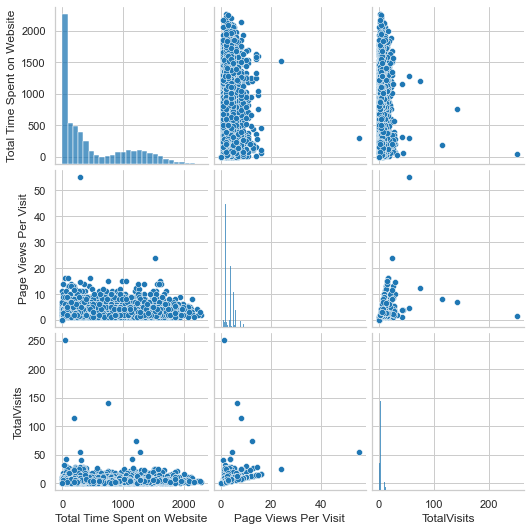

In [1169]:
sns.pairplot(Leads[numVar])
plt.show()

#### 1.2.2.1 Check the correlation between numeric variables 

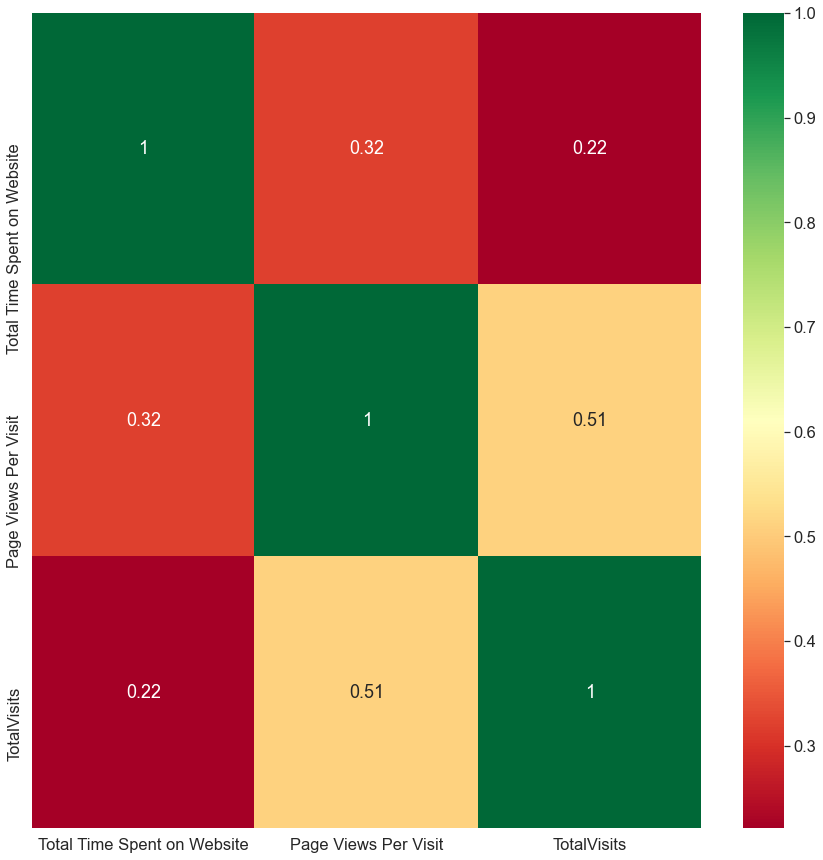

In [1170]:
%matplotlib inline
sns.set_style("whitegrid") 
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 1})
plt.figure(figsize=(15,15))
sns.heatmap(Leads[numVar].corr(), annot=True, cmap="RdYlGn")
plt.show()

`I.8-> Inference:`<br>
<font color=Blue> 
The "Page Views per visit" and "TotalVisits" are 50% correlated
</font>

In [1171]:
# Check the missing values in Numerical values
# ((Leads[numVar].isnull().sum(axis=0))/(Leads.shape[0]))*100
Leads[numVar].isnull().sum()
Leads.isnull().sum()

Lead Origin                                        0
Lead Source                                        0
Do Not Email                                       0
Converted                                          0
TotalVisits                                      137
Total Time Spent on Website                        0
Page Views Per Visit                             137
Specialization                                     0
How did you hear about X Education                 0
What is your current occupation                    0
What matters most to you in choosing a course      0
City                                               0
A free copy of Mastering The Interview             0
dtype: int64

In [1172]:
Leads.shape

(9240, 13)

In [1173]:
# Impute the missing values using Mean
# Leads['Page Views Per Visit']=Leads['Page Views Per Visit'].fillna(Leads['Page Views Per Visit'].mean())
# Leads['TotalVisits']=Leads['TotalVisits'].fillna(Leads['TotalVisits'].mean())
# Leads[numVar].isnull().sum(axis=0)

In [1174]:
# As the missing values are very less , Removing NaN Page Views Per Visit','TotalVisits' rows
Leads = Leads[~np.isnan(Leads['Page Views Per Visit'])]
Leads = Leads[~np.isnan(Leads['TotalVisits'])]

In [1175]:
Leads.shape

(9103, 13)

In [1176]:
# Check the missing values in Numerical values
((Leads[numVar].isnull().sum(axis=0))/(Leads.shape[0]))*100

Total Time Spent on Website    0.0
Page Views Per Visit           0.0
TotalVisits                    0.0
dtype: float64

In [1177]:
Leads.shape

(9103, 13)

###  3.6 Analyse each row and drop if you see 50% data is not populated for that Lead

In [1178]:
# Check the missing values in all variables
Leads.isnull().sum()

Lead Origin                                      0
Lead Source                                      0
Do Not Email                                     0
Converted                                        0
TotalVisits                                      0
Total Time Spent on Website                      0
Page Views Per Visit                             0
Specialization                                   0
How did you hear about X Education               0
What is your current occupation                  0
What matters most to you in choosing a course    0
City                                             0
A free copy of Mastering The Interview           0
dtype: int64

`I.9-> Inference:`<br>
<font color=Blue> 
There is no missing values in Dataframe
</font>

In [1179]:
# Create a Column to store the percent of missing value in the column and check
Leads[((Leads.isnull().sum(axis=1))/(Leads.shape[1]))*100>50]

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,City,A free copy of Mastering The Interview


`I.10- Inference:`<br>
<font color=Blue>
There are no rows with the missing values above 50%
</font>

In [1180]:
# Plot the NullpercentRow to study the percent missing in rows 
# plt.figure(figsize=(10,5))
# plt.xlim(0,100)
# plt.xlabel('NullpercentRow')
# plt.ylabel('Records')
# sns.distplot(Leads['NullpercentRow'],bins=10,kde=False)
# plt.show()


In [1181]:
dataCleanVar=Leads.columns
print(dataCleanVar)

Index(['Lead Origin', 'Lead Source', 'Do Not Email', 'Converted',
       'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit',
       'Specialization', 'How did you hear about X Education',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'City',
       'A free copy of Mastering The Interview'],
      dtype='object')


In [1182]:
Leads.head()

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,City,A free copy of Mastering The Interview
0,API,Olark Chat,No,0,0.0,0,0.0,Other,Other,Unemployed,Better Career Prospects,Other,No
1,API,Organic Search,No,0,5.0,674,2.5,Other,Other,Unemployed,Better Career Prospects,Other,No
2,Landing Page Submission,Direct Traffic,No,1,2.0,1532,2.0,Business Administration,Other,Student,Better Career Prospects,Mumbai,Yes
3,Landing Page Submission,Direct Traffic,No,0,1.0,305,1.0,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,Mumbai,No
4,Landing Page Submission,Google,No,1,2.0,1428,1.0,Other,Other,Unemployed,Better Career Prospects,Mumbai,No


## <font color = Red > Step4: Data Preperation: </font>

### 4.1 Convert Binary Yes / No to 1 and 0 

In [1183]:
# Find out the Binary varaiables in cleaned up data set
dtypes= Leads.dtypes
unique_count = Leads.nunique(dropna=False)
catAnalysis = pd.concat([dtypes, unique_count], axis=1)
catAnalysis.rename(columns = { 0: 'dtypes', 1 : 'uniqueVal'}, inplace = True)
catAnalysis.sort_values(by='uniqueVal', ascending= False)

,dtypes,uniqueVal
Total Time Spent on Website,int64,1717
Page Views Per Visit,float64,114
TotalVisits,float64,41
Specialization,object,13
Lead Source,object,9
How did you hear about X Education,object,9
City,object,7
What is your current occupation,object,6
Lead Origin,object,4
What matters most to you in choosing a course,object,3


In [1184]:
binaryVar= ['Do Not Email','A free copy of Mastering The Interview']
# 'Converted' NOT ADDED AS ITS TARGET
print(binaryVar)

['Do Not Email', 'A free copy of Mastering The Interview']


In [1185]:
Leads.loc[:10,['Do Not Email', 'Converted', 'A free copy of Mastering The Interview']]

,Do Not Email,Converted,A free copy of Mastering The Interview
0,No,0,No
1,No,0,No
2,No,1,Yes
3,No,0,No
4,No,1,No
5,No,0,No
6,No,1,No
7,No,0,No
8,No,0,Yes
9,No,0,No


In [1186]:
# List of variables to map

# Defining the map function
def binary_map(x):
    return x.map({'Yes': 1, "No": 0})

# Applying the function to the housing list
Leads[binaryVar] = Leads[binaryVar].apply(binary_map)
Leads.loc[:10,['Do Not Email', 'A free copy of Mastering The Interview','Converted']]

,Do Not Email,A free copy of Mastering The Interview,Converted
0,0,0,0
1,0,0,0
2,0,1,1
3,0,0,0
4,0,0,1
5,0,0,0
6,0,0,1
7,0,0,0
8,0,1,0
9,0,0,0


In [1187]:
Leads.head()

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,City,A free copy of Mastering The Interview
0,API,Olark Chat,0,0,0.0,0,0.0,Other,Other,Unemployed,Better Career Prospects,Other,0
1,API,Organic Search,0,0,5.0,674,2.5,Other,Other,Unemployed,Better Career Prospects,Other,0
2,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Business Administration,Other,Student,Better Career Prospects,Mumbai,1
3,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,Mumbai,0
4,Landing Page Submission,Google,0,1,2.0,1428,1.0,Other,Other,Unemployed,Better Career Prospects,Mumbai,0


In [1188]:
# Renaming columns for Simplicity
Leads.rename(columns = {
'Total Time Spent on Website' : 'timeSpent',
'Page Views Per Visit' : 'pgViews',
'TotalVisits' : 'totalVisits',
'Specialization' : 'Specialiszation',
'Lead Source' : 'leadSource',
'How did you hear about X Education' : 'howHeard',
'City' : 'city',
'What is your current occupation' : 'occupation',
'Lead Origin' : 'leadOrigin',
'What matters most to you in choosing a course' : 'mattersWhat',
'Do Not Email' : 'dnEmail',
'A free copy of Mastering The Interview' : 'freeCopy'
}, inplace="True")

In [1189]:
Leads.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9103 entries, 0 to 9239
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   leadOrigin       9103 non-null   object 
 1   leadSource       9103 non-null   object 
 2   dnEmail          9103 non-null   int64  
 3   Converted        9103 non-null   int64  
 4   totalVisits      9103 non-null   float64
 5   timeSpent        9103 non-null   int64  
 6   pgViews          9103 non-null   float64
 7   Specialiszation  9103 non-null   object 
 8   howHeard         9103 non-null   object 
 9   occupation       9103 non-null   object 
 10  mattersWhat      9103 non-null   object 
 11  city             9103 non-null   object 
 12  freeCopy         9103 non-null   int64  
dtypes: float64(2), int64(4), object(7)
memory usage: 1.3+ MB


In [1190]:
Leads.head()

,leadOrigin,leadSource,dnEmail,Converted,totalVisits,timeSpent,pgViews,Specialiszation,howHeard,occupation,mattersWhat,city,freeCopy
0,API,Olark Chat,0,0,0.0,0,0.0,Other,Other,Unemployed,Better Career Prospects,Other,0
1,API,Organic Search,0,0,5.0,674,2.5,Other,Other,Unemployed,Better Career Prospects,Other,0
2,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Business Administration,Other,Student,Better Career Prospects,Mumbai,1
3,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,Mumbai,0
4,Landing Page Submission,Google,0,1,2.0,1428,1.0,Other,Other,Unemployed,Better Career Prospects,Mumbai,0


### 4.2 For categorical variables with multiple levels, create dummy features (one-hot encoded)

In [1191]:
catVarOther=['Specialiszation',
'leadSource',
'howHeard',
'city',
'occupation',
'leadOrigin',
'mattersWhat'
]

print(catVarOther)

['Specialiszation', 'leadSource', 'howHeard', 'city', 'occupation', 'leadOrigin', 'mattersWhat']


In [1192]:
# Creating a dummy variable for some of the categorical variables and dropping the first one.
dummy1 = pd.get_dummies(Leads[catVarOther], drop_first=True)

# Adding the results to the master dataframe
Leads = pd.concat([Leads, dummy1], axis=1)

Leads.head()

,leadOrigin,leadSource,dnEmail,Converted,totalVisits,timeSpent,pgViews,Specialiszation,howHeard,occupation,...,occupation_Housewife,occupation_Other,occupation_Student,occupation_Unemployed,occupation_Working Professional,leadOrigin_Landing Page Submission,leadOrigin_Lead Add Form,leadOrigin_Lead Import,mattersWhat_Flexibility & Convenience,mattersWhat_Other
0,API,Olark Chat,0,0,0.0,0,0.0,Other,Other,Unemployed,...,0,0,0,1,0,0,0,0,0,0
1,API,Organic Search,0,0,5.0,674,2.5,Other,Other,Unemployed,...,0,0,0,1,0,0,0,0,0,0
2,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Business Administration,Other,Student,...,0,0,1,0,0,1,0,0,0,0
3,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Media and Advertising,Word Of Mouth,Unemployed,...,0,0,0,1,0,1,0,0,0,0
4,Landing Page Submission,Google,0,1,2.0,1428,1.0,Other,Other,Unemployed,...,0,0,0,1,0,1,0,0,0,0


In [1193]:
Leads.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9103 entries, 0 to 9239
Data columns (total 57 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   leadOrigin                                 9103 non-null   object 
 1   leadSource                                 9103 non-null   object 
 2   dnEmail                                    9103 non-null   int64  
 3   Converted                                  9103 non-null   int64  
 4   totalVisits                                9103 non-null   float64
 5   timeSpent                                  9103 non-null   int64  
 6   pgViews                                    9103 non-null   float64
 7   Specialiszation                            9103 non-null   object 
 8   howHeard                                   9103 non-null   object 
 9   occupation                                 9103 non-null   object 
 10  mattersWhat             

#### Dropping the repeated variables

In [1194]:
# We have created dummies for the below variables, so we can drop them
Leads = Leads.drop(catVarOther, 1)
Leads.head()

,dnEmail,Converted,totalVisits,timeSpent,pgViews,freeCopy,Specialiszation_Business Administration,Specialiszation_Finance Management,Specialiszation_Healthcare Management,Specialiszation_Human Resource Management,...,occupation_Housewife,occupation_Other,occupation_Student,occupation_Unemployed,occupation_Working Professional,leadOrigin_Landing Page Submission,leadOrigin_Lead Add Form,leadOrigin_Lead Import,mattersWhat_Flexibility & Convenience,mattersWhat_Other
0,0,0,0.0,0,0.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1,0,0,5.0,674,2.5,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,0,1,2.0,1532,2.0,1,1,0,0,0,...,0,0,1,0,0,1,0,0,0,0
3,0,0,1.0,305,1.0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
4,0,1,2.0,1428,1.0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0


In [1195]:
Leads.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9103 entries, 0 to 9239
Data columns (total 50 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   dnEmail                                    9103 non-null   int64  
 1   Converted                                  9103 non-null   int64  
 2   totalVisits                                9103 non-null   float64
 3   timeSpent                                  9103 non-null   int64  
 4   pgViews                                    9103 non-null   float64
 5   freeCopy                                   9103 non-null   int64  
 6   Specialiszation_Business Administration    9103 non-null   uint8  
 7   Specialiszation_Finance Management         9103 non-null   uint8  
 8   Specialiszation_Healthcare Management      9103 non-null   uint8  
 9   Specialiszation_Human Resource Management  9103 non-null   uint8  
 10  Specialiszation_IT Proje

In [1196]:
Leads.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9103 entries, 0 to 9239
Data columns (total 50 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   dnEmail                                    9103 non-null   int64  
 1   Converted                                  9103 non-null   int64  
 2   totalVisits                                9103 non-null   float64
 3   timeSpent                                  9103 non-null   int64  
 4   pgViews                                    9103 non-null   float64
 5   freeCopy                                   9103 non-null   int64  
 6   Specialiszation_Business Administration    9103 non-null   uint8  
 7   Specialiszation_Finance Management         9103 non-null   uint8  
 8   Specialiszation_Healthcare Management      9103 non-null   uint8  
 9   Specialiszation_Human Resource Management  9103 non-null   uint8  
 10  Specialiszation_IT Proje

### 4.3 Outliet Treatment

In [1197]:
# Checking outliers at 25%, 50%, 75%, 90%, 95% and 99%
Leads['totalVisits'].describe(percentiles=[.25, .5, .75, .90, .95, .99])

count    9103.000000
mean        3.445238
std         4.854853
min         0.000000
25%         1.000000
50%         3.000000
75%         5.000000
90%         7.000000
95%        10.000000
99%        17.000000
max       251.000000
Name: totalVisits, dtype: float64

In [1198]:
Leads['timeSpent'].describe(percentiles=[.25, .5, .75, .90, .95, .99])

count    9103.000000
mean      481.350104
std       545.066142
min         0.000000
25%         9.000000
50%       244.000000
75%       919.500000
90%      1372.000000
95%      1556.900000
99%      1838.960000
max      2272.000000
Name: timeSpent, dtype: float64

In [1199]:
Leads['pgViews'].describe(percentiles=[.25, .5, .75, .90, .95, .99])

count    9103.000000
mean        2.362820
std         2.161418
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
90%         5.000000
95%         6.000000
99%         9.000000
max        55.000000
Name: pgViews, dtype: float64

### Cap the outliers with 95 percentile value

In [1200]:
Leads['totalVisits']=Leads['totalVisits'].apply(lambda x: 17 if x >17 else x)
Leads['totalVisits'].describe(percentiles=[.25, .5, .75, .90, .95, .99])

count    9103.000000
mean        3.332747
std         3.252420
min         0.000000
25%         1.000000
50%         3.000000
75%         5.000000
90%         7.000000
95%        10.000000
99%        17.000000
max        17.000000
Name: totalVisits, dtype: float64

In [1201]:
Leads['timeSpent']=Leads['timeSpent'].apply(lambda x: 1838.96 if x >17 else x)
Leads['timeSpent'].describe(percentiles=[.25, .5, .75, .90, .95, .99])

count    9103.000000
mean     1360.958097
std       806.410207
min         0.000000
25%         9.000000
50%      1838.960000
75%      1838.960000
90%      1838.960000
95%      1838.960000
99%      1838.960000
max      1838.960000
Name: timeSpent, dtype: float64

In [1202]:
Leads['pgViews']=Leads['pgViews'].apply(lambda x: 9 if x >9 else x)
Leads['pgViews'].describe(percentiles=[.25, .5, .75, .90, .95, .99])

count    9103.000000
mean        2.334002
std         1.985712
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
90%         5.000000
95%         6.000000
99%         9.000000
max         9.000000
Name: pgViews, dtype: float64

In [1203]:
Leads.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9103 entries, 0 to 9239
Data columns (total 50 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   dnEmail                                    9103 non-null   int64  
 1   Converted                                  9103 non-null   int64  
 2   totalVisits                                9103 non-null   float64
 3   timeSpent                                  9103 non-null   float64
 4   pgViews                                    9103 non-null   float64
 5   freeCopy                                   9103 non-null   int64  
 6   Specialiszation_Business Administration    9103 non-null   uint8  
 7   Specialiszation_Finance Management         9103 non-null   uint8  
 8   Specialiszation_Healthcare Management      9103 non-null   uint8  
 9   Specialiszation_Human Resource Management  9103 non-null   uint8  
 10  Specialiszation_IT Proje

In [1204]:
Leads.head()

,dnEmail,Converted,totalVisits,timeSpent,pgViews,freeCopy,Specialiszation_Business Administration,Specialiszation_Finance Management,Specialiszation_Healthcare Management,Specialiszation_Human Resource Management,...,occupation_Housewife,occupation_Other,occupation_Student,occupation_Unemployed,occupation_Working Professional,leadOrigin_Landing Page Submission,leadOrigin_Lead Add Form,leadOrigin_Lead Import,mattersWhat_Flexibility & Convenience,mattersWhat_Other
0,0,0,0.0,0.00,0.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1,0,0,5.0,1838.96,2.5,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,0,1,2.0,1838.96,2.0,1,1,0,0,0,...,0,0,1,0,0,1,0,0,0,0
3,0,0,1.0,1838.96,1.0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
4,0,1,2.0,1838.96,1.0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0


### 4.4 Perform Test Train split

In [1205]:
from sklearn.model_selection import train_test_split

In [1206]:
df=Leads   # User input

from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
np.random.seed(0)
df_train, df_test = train_test_split(df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [1207]:
df_train.shape

(6372, 50)

In [1208]:
df_test.shape

(2731, 50)

In [1209]:
### 5.1 Dividing into X and Y sets for the model building

In [1210]:
y_train = df_train.pop("Converted")
X_train = df_train

In [1211]:
y_train.head()

7962    0
5520    0
1962    0
1566    1
9170    0
Name: Converted, dtype: int64

In [1212]:
X_train.shape

(6372, 49)

In [1213]:
df_train.shape

(6372, 49)

In [1214]:
X_train.shape

(6372, 49)

In [1215]:
X_train.head()

,dnEmail,totalVisits,timeSpent,pgViews,freeCopy,Specialiszation_Business Administration,Specialiszation_Finance Management,Specialiszation_Healthcare Management,Specialiszation_Human Resource Management,Specialiszation_IT Projects Management,...,occupation_Housewife,occupation_Other,occupation_Student,occupation_Unemployed,occupation_Working Professional,leadOrigin_Landing Page Submission,leadOrigin_Lead Add Form,leadOrigin_Lead Import,mattersWhat_Flexibility & Convenience,mattersWhat_Other
7962,0,3.0,1838.96,1.5,0,0,0,0,0,1,...,0,0,0,1,0,1,0,0,0,0
5520,0,7.0,1838.96,7.0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
1962,0,5.0,1838.96,2.5,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
1566,0,14.0,1838.96,3.5,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
9170,0,0.0,0.00,0.0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [1216]:
y_train.shape

(6372,)

In [1217]:
y_train.head()

7962    0
5520    0
1962    0
1566    1
9170    0
Name: Converted, dtype: int64

### Step5: Feature Scaling

In [1218]:
from sklearn.preprocessing import MinMaxScaler

In [1219]:
# We use minmax scaler
scaler = MinMaxScaler()

In [1220]:
# Faetures to be scaled stored in variable
numVar = ['totalVisits',
'timeSpent',
'pgViews'
]
print(numVar)

['totalVisits', 'timeSpent', 'pgViews']


In [1221]:
# Apply scaler
df_train[numVar] = scaler.fit_transform(df_train[numVar])

In [1222]:
df_train.head()

,dnEmail,totalVisits,timeSpent,pgViews,freeCopy,Specialiszation_Business Administration,Specialiszation_Finance Management,Specialiszation_Healthcare Management,Specialiszation_Human Resource Management,Specialiszation_IT Projects Management,...,occupation_Housewife,occupation_Other,occupation_Student,occupation_Unemployed,occupation_Working Professional,leadOrigin_Landing Page Submission,leadOrigin_Lead Add Form,leadOrigin_Lead Import,mattersWhat_Flexibility & Convenience,mattersWhat_Other
7962,0,0.176471,1.0,0.166667,0,0,0,0,0,1,...,0,0,0,1,0,1,0,0,0,0
5520,0,0.411765,1.0,0.777778,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
1962,0,0.294118,1.0,0.277778,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
1566,0,0.823529,1.0,0.388889,0,0,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0
9170,0,0.000000,0.0,0.000000,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [1223]:
df_train.describe()

,dnEmail,totalVisits,timeSpent,pgViews,freeCopy,Specialiszation_Business Administration,Specialiszation_Finance Management,Specialiszation_Healthcare Management,Specialiszation_Human Resource Management,Specialiszation_IT Projects Management,...,occupation_Housewife,occupation_Other,occupation_Student,occupation_Unemployed,occupation_Working Professional,leadOrigin_Landing Page Submission,leadOrigin_Lead Add Form,leadOrigin_Lead Import,mattersWhat_Flexibility & Convenience,mattersWhat_Other
count,6372.000000,6372.000000,6372.000000,6372.000000,6372.000000,6372.000000,6372.000000,6372.00000,6372.000000,6372.000000,...,6372.000000,6372.000000,6372.000000,6372.000000,6372.000000,6372.000000,6372.000000,6372.000000,6372.000000,6372.000000
mean,0.079567,0.196919,0.739430,0.259201,0.316855,0.041588,0.105304,0.01742,0.092436,0.039234,...,0.001099,0.293785,0.020559,0.609699,0.073917,0.536566,0.067797,0.004080,0.000157,0.294099
std,0.270643,0.193044,0.438864,0.220309,0.465287,0.199662,0.306969,0.13084,0.289663,0.194167,...,0.033129,0.455531,0.141913,0.487856,0.261657,0.498700,0.251416,0.063752,0.012527,0.455673
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.058824,0.004894,0.111111,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.176471,1.000000,0.222222,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.294118,1.000000,0.333333,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [1224]:
### Checking the Coversion Rate in the whole data frame
Coversion = (sum(Leads['Converted'])/len(Leads['Converted'].index))*100
Coversion

38.02043282434362

In [1225]:
### Checking the Coversion Rate in the Train data frame
# Coversion_train = (sum(df_train['Converted'])/len(df_train['Converted'].index))*100
# Coversion_train

In [1226]:
### Checking the Coversion Rate in the Test data frame
CoversionTest = (sum(df_test['Converted'])/len(df_test['Converted'].index))*100
CoversionTest

38.15452215305749

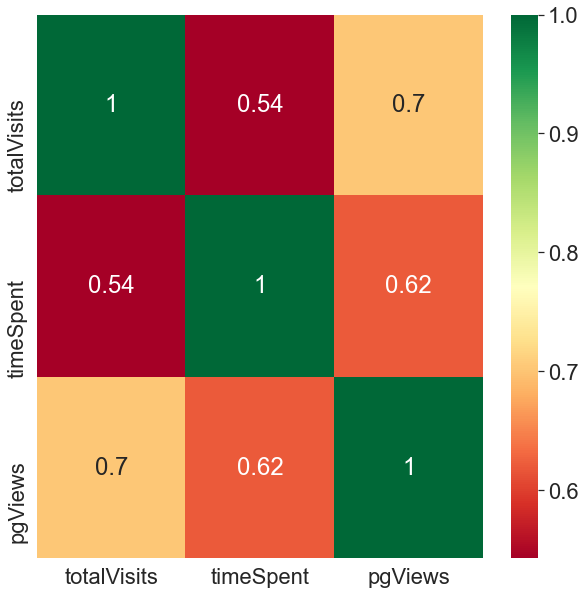

In [1227]:
# Let's check the correlation coefficients to see which variables are highly correlated

%matplotlib inline
sns.set_style("whitegrid") 
sns.set_context("notebook", font_scale=2, rc={"lines.linewidth": 1.5})
plt.figure(figsize=(10,10))
sns.heatmap(df_train[numVar].corr(), annot=True, cmap="RdYlGn")
plt.show()

In [1228]:
%matplotlib inline
sns.set_style("whitegrid") 
sns.set_context("notebook", font_scale=5, rc={"lines.linewidth": 5})
plt.figure(figsize=(150,150))
sns.heatmap(df_train.corr(), annot=True, cmap="RdYlGn")
plt.show()

`I.11-> Inference:`<br>
<font color=Blue> The Corr Coefficient of the highly correlated variables and mentioned below:<br>
totalVisits and pgViews -> 0.62<br>
leadSource_Olark Chat and timeSpent -> -0.73<br>
Specialiszation_Otherand city_Other-> 0.75<br>
leadSource_Facebook and leadOrigin_Lead Import -> 0.96<br>
leadSource_Reference and leadOrigin_Lead Add Form -> 0.84<br>
occupation_Other and mattersWhat_Other -> 0.99<br>
occupation_Unemployed and occupation_Other -? -0.81 <br>
city_Other and lead origin leadOrigin_Landing Page Submission -> -0.82<br>
</font>

## <font color = Red> Step6: Model Building: </font>


In [1229]:
# 2 Models were built using the below 2 approaches:

# Approach 1: 
# Include all the variable and build the model using Sklearn
# Assess the model using stats model and remove the multicollinearity using the VIF
# Approach 2: 
# Remove Collinear variables 
# Build the model using Sklearn
# Assess the model using stats model and remove the multicollinearity using the VIF


In [1230]:
import statsmodels.api as sm

###  6.1 Feature Selection Using RFE

In [1231]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [1232]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 15)   #      Cut off set as 15    
rfe = rfe.fit(X_train, y_train)

In [1233]:
rfe.support_

array([ True,  True, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False,  True,  True,  True, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False,  True, False,  True,  True,  True,  True,
        True,  True, False,  True])

In [1234]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('dnEmail', True, 1),
 ('totalVisits', True, 1),
 ('timeSpent', False, 9),
 ('pgViews', False, 8),
 ('freeCopy', False, 17),
 ('Specialiszation_Business Administration', False, 27),
 ('Specialiszation_Finance Management', False, 19),
 ('Specialiszation_Healthcare Management', False, 21),
 ('Specialiszation_Human Resource Management', False, 22),
 ('Specialiszation_IT Projects Management', False, 25),
 ('Specialiszation_International Business', False, 5),
 ('Specialiszation_Marketing Management', False, 29),
 ('Specialiszation_Media and Advertising', False, 15),
 ('Specialiszation_Operations Management', False, 26),
 ('Specialiszation_Other', True, 1),
 ('Specialiszation_Supply Chain Management', False, 18),
 ('Specialiszation_Travel and Tourism', False, 20),
 ('leadSource_Facebook', False, 16),
 ('leadSource_Google', False, 12),
 ('leadSource_Olark Chat', False, 11),
 ('leadSource_Organic Search', False, 23),
 ('leadSource_Other', False, 7),
 ('leadSource_Reference', False, 31),
 ('le

In [1235]:
col = X_train.columns[rfe.support_]

In [1236]:
col

Index(['dnEmail', 'totalVisits', 'Specialiszation_Other',
       'leadSource_Referral Sites', 'leadSource_Welingak Website',
       'howHeard_Email', 'city_Other', 'occupation_Housewife',
       'occupation_Student', 'occupation_Unemployed',
       'occupation_Working Professional', 'leadOrigin_Landing Page Submission',
       'leadOrigin_Lead Add Form', 'leadOrigin_Lead Import',
       'mattersWhat_Other'],
      dtype='object')

In [1237]:
# Creating X_train_rfe dataframe with RFE selected variables
X_train_rfe = X_train[col]

#### 6.2 Assessing the model with StatsModels  and Build Model iteratively

In [1238]:
def buildModel(df_y_train,df_X_train):
    X_train_sm = sm.add_constant(df_X_train)
    logmodel = sm.GLM(df_y_train,X_train_sm, family = sm.families.Binomial())
    res = logmodel.fit()
    print(res.summary())
    return


In [1239]:
buildModel(y_train,X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6356
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3299.0
Date:                Mon, 14 Jun 2021   Deviance:                       6598.0
Time:                        23:40:31   Pearson chi2:                 6.68e+03
No. Iterations:                    21                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

In [1240]:
import statsmodels.api as sm  
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [1241]:
# Calculate the VIFs for the new model

def calVIF (df):
    vif = pd.DataFrame()
    X = df
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return vif

In [1242]:
calVIF(X_train_rfe)

,Features,VIF
9,occupation_Unemployed,9.28
11,leadOrigin_Landing Page Submission,7.69
6,city_Other,6.61
14,mattersWhat_Other,5.26
2,Specialiszation_Other,4.45
1,totalVisits,2.60
10,occupation_Working Professional,2.05
12,leadOrigin_Lead Add Form,1.71
4,leadSource_Welingak Website,1.35
8,occupation_Student,1.25


In [1243]:
# occupation_Housewife extremely has p value > 0.05 and hence remove this variable and run the model   
dropVar=['occupation_Housewife']
X_train_rfe = X_train_rfe.drop(dropVar, axis = 1)

In [1244]:
buildModel(y_train,X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6357
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3302.0
Date:                Mon, 14 Jun 2021   Deviance:                       6604.1
Time:                        23:40:32   Pearson chi2:                 6.69e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

In [1245]:
calVIF(X_train_rfe)

,Features,VIF
8,occupation_Unemployed,9.20
10,leadOrigin_Landing Page Submission,7.62
6,city_Other,6.58
13,mattersWhat_Other,5.23
2,Specialiszation_Other,4.45
1,totalVisits,2.60
9,occupation_Working Professional,2.04
11,leadOrigin_Lead Add Form,1.71
4,leadSource_Welingak Website,1.35
7,occupation_Student,1.25


In [1246]:
# leadOrigin_Lead Import has p value more than 0.05 and hence remove this variable and run the model    
dropVar=['leadOrigin_Lead Import']
X_train_rfe = X_train_rfe.drop(dropVar, axis = 1)

In [1247]:
buildModel(y_train,X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6358
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3303.4
Date:                Mon, 14 Jun 2021   Deviance:                       6606.8
Time:                        23:40:32   Pearson chi2:                 6.68e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

In [1248]:
calVIF(X_train_rfe)

,Features,VIF
8,occupation_Unemployed,8.85
10,leadOrigin_Landing Page Submission,7.40
6,city_Other,6.35
12,mattersWhat_Other,5.09
2,Specialiszation_Other,4.44
1,totalVisits,2.59
9,occupation_Working Professional,1.99
11,leadOrigin_Lead Add Form,1.70
4,leadSource_Welingak Website,1.35
7,occupation_Student,1.24


In [1249]:
# howHeard_Email has p value more than 0.05 and hence remove this variable and run the model    
dropVar=['howHeard_Email']
X_train_rfe = X_train_rfe.drop(dropVar, axis = 1)

In [1250]:
buildModel(y_train,X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6359
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3304.8
Date:                Mon, 14 Jun 2021   Deviance:                       6609.6
Time:                        23:40:33   Pearson chi2:                 6.68e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

In [1251]:
calVIF(X_train_rfe)

,Features,VIF
7,occupation_Unemployed,8.85
9,leadOrigin_Landing Page Submission,7.40
5,city_Other,6.35
11,mattersWhat_Other,5.09
2,Specialiszation_Other,4.44
1,totalVisits,2.59
8,occupation_Working Professional,1.99
10,leadOrigin_Lead Add Form,1.70
4,leadSource_Welingak Website,1.35
6,occupation_Student,1.24


In [1252]:
# occupation_Unemployed has VIF >4 and hence remove this variable and run the model    
dropVar=['occupation_Unemployed']
X_train_rfe = X_train_rfe.drop(dropVar, axis = 1)

In [1253]:
buildModel(y_train,X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6360
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3307.4
Date:                Mon, 14 Jun 2021   Deviance:                       6614.7
Time:                        23:40:33   Pearson chi2:                 6.68e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

In [1254]:
calVIF(X_train_rfe)

,Features,VIF
5,city_Other,4.27
2,Specialiszation_Other,4.03
8,leadOrigin_Landing Page Submission,2.53
1,totalVisits,2.35
10,mattersWhat_Other,1.55
9,leadOrigin_Lead Add Form,1.47
4,leadSource_Welingak Website,1.34
7,occupation_Working Professional,1.20
0,dnEmail,1.11
3,leadSource_Referral Sites,1.04


In [1255]:
# occupation_Student has p value more than 0.05 and hence remove this variable and run the model    
dropVar=['occupation_Student']
X_train_rfe = X_train_rfe.drop(dropVar, axis = 1)

In [1256]:
buildModel(y_train,X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6361
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3307.7
Date:                Mon, 14 Jun 2021   Deviance:                       6615.4
Time:                        23:40:34   Pearson chi2:                 6.68e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

In [1257]:
calVIF(X_train_rfe)

,Features,VIF
5,city_Other,4.26
2,Specialiszation_Other,4.02
7,leadOrigin_Landing Page Submission,2.51
1,totalVisits,2.35
9,mattersWhat_Other,1.54
8,leadOrigin_Lead Add Form,1.47
4,leadSource_Welingak Website,1.33
6,occupation_Working Professional,1.19
0,dnEmail,1.11
3,leadSource_Referral Sites,1.04


In [1258]:
# city_Other has VIF more than 4 and hence remove this variable and run the model    
dropVar=['city_Other']
X_train_rfe = X_train_rfe.drop(dropVar, axis = 1)

In [1259]:
buildModel(y_train,X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6362
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3317.2
Date:                Mon, 14 Jun 2021   Deviance:                       6634.4
Time:                        23:40:34   Pearson chi2:                 6.61e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
cons

In [1260]:
calVIF(X_train_rfe)

,Features,VIF
6,leadOrigin_Landing Page Submission,2.35
1,totalVisits,2.32
2,Specialiszation_Other,1.49
8,mattersWhat_Other,1.48
7,leadOrigin_Lead Add Form,1.42
4,leadSource_Welingak Website,1.33
5,occupation_Working Professional,1.14
0,dnEmail,1.11
3,leadSource_Referral Sites,1.04


In [1261]:
# Final model chosen is:

#                  Generalized Linear Model Regression Results                  
# ==============================================================================
# Dep. Variable:              Converted   No. Observations:                 6372
# Model:                            GLM   Df Residuals:                     6362
# Model Family:                Binomial   Df Model:                            9
# Link Function:                  logit   Scale:                          1.0000
# Method:                          IRLS   Log-Likelihood:                -3317.2
# Date:                Sun, 13 Jun 2021   Deviance:                       6634.4
# Time:                        00:55:36   Pearson chi2:                 6.61e+03
# No. Iterations:                     7                                         
# Covariance Type:            nonrobust                                         
# ======================================================================================================
#                                          coef    std err          z      P>|z|      [0.025      0.975]
# ------------------------------------------------------------------------------------------------------
# const                                 -0.1093      0.090     -1.210      0.226      -0.287       0.068
# dnEmail                               -1.3299      0.147     -9.039      0.000      -1.618      -1.042
# totalVisits                            1.2560      0.167      7.527      0.000       0.929       1.583
# Specialiszation_Other                 -0.6469      0.088     -7.316      0.000      -0.820      -0.474
# leadSource_Referral Sites             -0.6748      0.292     -2.314      0.021      -1.246      -0.103
# leadSource_Welingak Website            2.1985      0.750      2.932      0.003       0.729       3.668
# occupation_Working Professional        2.4775      0.172     14.421      0.000       2.141       2.814
# leadOrigin_Landing Page Submission    -0.5164      0.089     -5.788      0.000      -0.691      -0.342
# leadOrigin_Lead Add Form               2.6427      0.220     12.016      0.000       2.212       3.074
# mattersWhat_Other                     -1.2875      0.077    -16.769      0.000      -1.438      -1.137
# ======================================================================================================


In [1262]:
X_train_sm = sm.add_constant(X_train_rfe)
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6362
Model Family:                Binomial   Df Model:                            9
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3317.2
Date:                Mon, 14 Jun 2021   Deviance:                       6634.4
Time:                        23:40:35   Pearson chi2:                 6.61e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
const                                 -0.1093      0.090     -1.210      0.226      -0.287       0.068
dnEmail                               -1.3299      0.147     -9.039      0.000      -1.618      -1.042
totalVisits                            1.2560      0.167      7.527      0.000       0.929       1.583
Specialiszation_Other                 -0.6469      0.088     -7.316      0.000      -0.820      -0.474
leadSource_Referral Sites             -0.6748      0.292     -2.314      0.021      -1.246      -0.103
leadSource_Welingak Website            2.1985      0.750      2.932      0.003       0.729       3.668
occupation_Working Professional        2.4775      0.172     14.421      0.000       2.141       2.814
leadOrigin_Landing Page Submission    -0.5164      0.089     -5.788      0.000      -0.691      -0.342
leadOrigin_Lead Add Form               2.6427      0.220     12.016      0.000       2.212       3.074
mattersWhat_Other                     -1.2875      0.077    -16.769      0.000      -1.438      -1.137
======================================================================================================
"""

In [1263]:
# Getting the predicted values on the train set
X_train_sm = sm.add_constant(X_train_rfe)
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

7962    0.400333
5520    0.472890
1962    0.288395
1566    0.947155
9170    0.319465
5097    0.114690
8954    0.418193
309     0.436271
5519    0.114690
1050    0.382734
dtype: float64

## <font color = Red> Step7: Model Accuracy, Sensitivity Calculation.</font>

In [1264]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.40033329, 0.47289   , 0.28839486, 0.94715498, 0.31946525,
       0.11468969, 0.41819341, 0.43627064, 0.11468969, 0.38273417])

#### Creating a dataframe with the actual Coversion flag and the predicted probabilities

In [1265]:
                                 
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Convertion_Prob':y_train_pred})
y_train_pred_final.head()

,Converted,Convertion_Prob
0,0,0.400333
1,0,0.472890
2,0,0.288395
3,1,0.947155
4,0,0.319465


#### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [1266]:
y_train_pred_final['predicted'] = y_train_pred_final['Convertion_Prob'].map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Converted,Convertion_Prob,predicted
0,0,0.400333,0
1,0,0.472890,0
2,0,0.288395,0
3,1,0.947155,1
4,0,0.319465,0


In [1267]:
from sklearn import metrics

In [1268]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final['predicted'] )
print(confusion)

[[3716  237]
 [1435  984]]


In [1269]:
confusion[0,1]

237

In [1270]:
# Predicted--->       not_Converted    Converted
# Actual  \/
# not_Converted        3719             234
# Converted            1421             998  

In [1271]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final['Converted'], y_train_pred_final['predicted']))

0.7376020087884495


In [1272]:
calVIF(X_train_rfe)

,Features,VIF
6,leadOrigin_Landing Page Submission,2.35
1,totalVisits,2.32
2,Specialiszation_Other,1.49
8,mattersWhat_Other,1.48
7,leadOrigin_Lead Add Form,1.42
4,leadSource_Welingak Website,1.33
5,occupation_Working Professional,1.14
0,dnEmail,1.11
3,leadSource_Referral Sites,1.04


## Metrics beyond simply accuracy

In [1273]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [1274]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.4067796610169492

In [1275]:
# Let us calculate specificity
TN / float(TN+FP)

0.940045535036681

In [1276]:
# Calculate false postive rate - predicting Lead is not converted
print(FP/ float(TN+FP))

0.059954464963319


In [1277]:
# positive predictive value 
print (TP / float(TP+FP))

0.8058968058968059


###   <font color = Red>Plotting the ROC Curve </font>

An ROC curve demonstrates several things:

- It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).
- The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
- The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [1278]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    
    sns.set_style("whitegrid") 
    sns.set_context("notebook", font_scale=2, rc={"lines.linewidth": 2})
    plt.figure(figsize=(10,10))

    plt.figure(figsize=(10, 10))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return

In [1279]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final['Converted'], y_train_pred_final['Convertion_Prob'], drop_intermediate = False )

<Figure size 720x720 with 0 Axes>

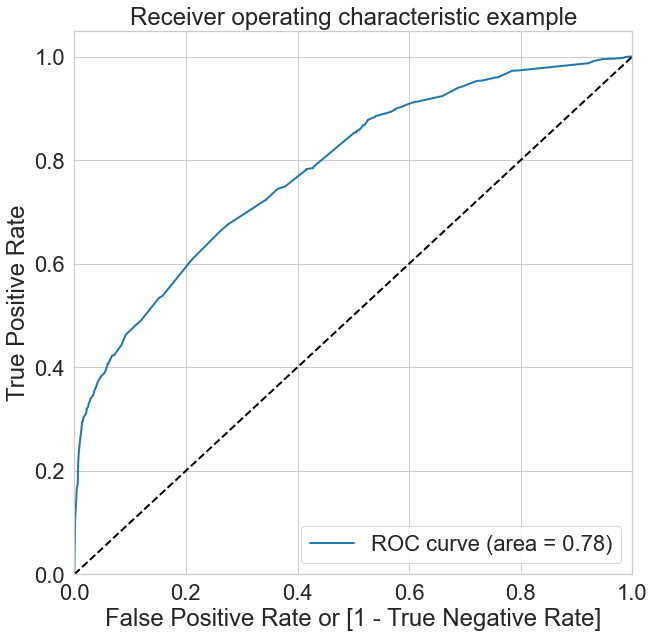

In [1280]:

draw_roc(y_train_pred_final['Converted'], y_train_pred_final['Convertion_Prob'])

## <font color = Red>Step8: Finding Optimal Cutoff Point</font>

Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [1281]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final['Convertion_Prob'].map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Convertion_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.400333,0,1,1,1,1,1,0,0,0,0,0
1,0,0.472890,0,1,1,1,1,1,0,0,0,0,0
2,0,0.288395,0,1,1,1,0,0,0,0,0,0,0
3,1,0.947155,1,1,1,1,1,1,1,1,1,1,1
4,0,0.319465,0,1,1,1,1,0,0,0,0,0,0


In [1282]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.379630  1.000000  0.000000
0.1   0.1  0.419178  0.991732  0.068808
0.2   0.2  0.607345  0.893758  0.432077
0.3   0.3  0.631199  0.854072  0.494814
0.4   0.4  0.709510  0.663911  0.737415
0.5   0.5  0.737602  0.406780  0.940046
0.6   0.6  0.729912  0.331129  0.973944
0.7   0.7  0.723949  0.298884  0.984063
0.8   0.8  0.723478  0.294337  0.986087
0.9   0.9  0.690835  0.196362  0.993423


<Figure size 1800x1800 with 0 Axes>

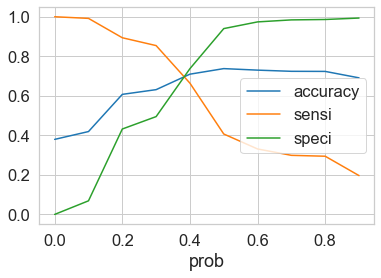

In [1283]:
# Let's plot accuracy sensitivity and specificity for various probabilities.

sns.set_style("whitegrid") 
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 1.5})
plt.figure(figsize=(25,25))
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### From the curve above, 0.3 is the optimum point to take it as a cutoff probability.

In [1284]:
y_train_pred_final['predicted'] = y_train_pred_final['Convertion_Prob'].map(lambda x: 1 if x > 0.3 else 0)

# Let's see the head
y_train_pred_final.head()

,Converted,Convertion_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.400333,1,1,1,1,1,1,0,0,0,0,0
1,0,0.472890,1,1,1,1,1,1,0,0,0,0,0
2,0,0.288395,0,1,1,1,0,0,0,0,0,0,0
3,1,0.947155,1,1,1,1,1,1,1,1,1,1,1
4,0,0.319465,1,1,1,1,1,0,0,0,0,0,0


In [1285]:
from sklearn import metrics

In [1286]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final['predicted'] )
print(confusion)

[[1956 1997]
 [ 353 2066]]


In [1287]:
# Predicted--->       not_Converted    Converted
# Actual  \/
# not_Converted        1956              1997
# Converted            353               2066  

In [1288]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final['Converted'], y_train_pred_final['predicted']))

0.6311989956057753


In [1289]:
calVIF(X_train_rfe)

,Features,VIF
6,leadOrigin_Landing Page Submission,2.35
1,totalVisits,2.32
2,Specialiszation_Other,1.49
8,mattersWhat_Other,1.48
7,leadOrigin_Lead Add Form,1.42
4,leadSource_Welingak Website,1.33
5,occupation_Working Professional,1.14
0,dnEmail,1.11
3,leadSource_Referral Sites,1.04


## Metrics beyond simply accuracy

In [1290]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [1291]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.854071930549814

In [1292]:
# Let us calculate specificity
TN / float(TN+FP)

0.4948140652668859

In [1293]:
# Calculate false postive rate - predicting Lead is not converted
print(FP/ float(TN+FP))

0.5051859347331141


In [1294]:
# positive predictive value 
print (TP / float(TP+FP))

0.5084912626138322


### Precision and Recall

In [1295]:
#Looking at the confusion matrix again

In [1296]:
confusion = metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final['predicted'] )
confusion

array([[1956, 1997],
       [ 353, 2066]], dtype=int64)

##### Precision
TP / TP + FP

In [1297]:
confusion[1,1]/(confusion[0,1]+confusion[1,1])

0.5084912626138322

In [1298]:
# Using sklearn utilities for the same

In [1299]:
from sklearn.metrics import precision_score, recall_score

In [1300]:
# ?precision_score

In [1301]:
precision_score(y_train_pred_final['Converted'], y_train_pred_final['predicted'])

0.5084912626138322

In [1302]:
recall_score(y_train_pred_final['Converted'], y_train_pred_final['predicted'])

0.854071930549814

### Precision and recall tradeoff

In [1303]:
from sklearn.metrics import precision_recall_curve

In [1304]:
y_train_pred_final['Converted'], y_train_pred_final['predicted']

(0       0
 1       0
 2       0
 3       1
 4       0
        ..
 6367    0
 6368    1
 6369    1
 6370    1
 6371    0
 Name: Converted, Length: 6372, dtype: int64,
 0       1
 1       1
 2       0
 3       1
 4       1
        ..
 6367    0
 6368    1
 6369    1
 6370    1
 6371    1
 Name: predicted, Length: 6372, dtype: int64)

In [1305]:
p, r, thresholds = precision_recall_curve(y_train_pred_final['Converted'], y_train_pred_final['Convertion_Prob'])

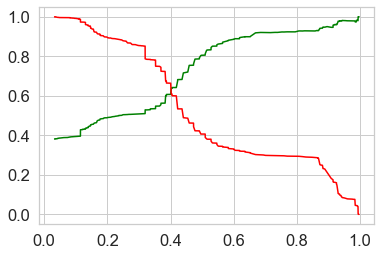

In [1306]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

## <font color = Red> Step9: Making predictions on the test set</font>

In [1307]:
# Faetures to be scaled stored in variable
numVar = ['totalVisits',
'timeSpent',
'pgViews'
]
print(numVar)

['totalVisits', 'timeSpent', 'pgViews']


In [1308]:
# Apply scaler
df_test[numVar] = scaler.fit_transform(df_test[numVar])

### Dividing into X_test and y_test

In [1309]:
y_test = df_test.pop('Converted')
X_test = df_test
y_test.head()

3504    0
4050    1
7201    0
1196    0
8219    1
Name: Converted, dtype: int64

In [1310]:
df_test.head()

,dnEmail,totalVisits,timeSpent,pgViews,freeCopy,Specialiszation_Business Administration,Specialiszation_Finance Management,Specialiszation_Healthcare Management,Specialiszation_Human Resource Management,Specialiszation_IT Projects Management,...,occupation_Housewife,occupation_Other,occupation_Student,occupation_Unemployed,occupation_Working Professional,leadOrigin_Landing Page Submission,leadOrigin_Lead Add Form,leadOrigin_Lead Import,mattersWhat_Flexibility & Convenience,mattersWhat_Other
3504,0,0.176471,1.0,0.333333,1,1,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
4050,0,0.000000,0.0,0.000000,0,1,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
7201,1,0.117647,1.0,0.222222,1,0,0,1,0,0,...,0,0,0,1,0,1,0,0,0,0
1196,0,0.235294,1.0,0.444444,1,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
8219,0,0.411765,1.0,0.194444,1,0,1,0,0,0,...,0,0,0,1,0,1,0,0,0,0


In [1311]:
colTest=X_train_rfe.columns

In [1312]:
X_test = X_test[colTest]
X_test.head()

,dnEmail,totalVisits,Specialiszation_Other,leadSource_Referral Sites,leadSource_Welingak Website,occupation_Working Professional,leadOrigin_Landing Page Submission,leadOrigin_Lead Add Form,mattersWhat_Other
3504,0,0.176471,0,0,0,0,1,0,0
4050,0,0.000000,0,0,0,0,0,1,0
7201,1,0.117647,0,0,0,0,1,0,0
1196,0,0.235294,0,0,0,0,1,0,0
8219,0,0.411765,0,0,0,0,1,0,0


In [1313]:
X_test_sm = sm.add_constant(X_test)
y_test_pred = res.predict(X_test_sm)
y_test_pred[:10]

3504    0.400333
4050    0.926448
7201    0.140903
1196    0.418193
8219    0.472890
8747    0.114690
9048    0.044023
6524    0.382734
7693    0.140903
8187    0.868355
dtype: float64

In [1314]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [1315]:
# Let's see the head
y_pred_1.head()

,0
3504,0.400333
4050,0.926448
7201,0.140903
1196,0.418193
8219,0.472890


In [1316]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)
y_test_df.head()

,Converted
3504,0
4050,1
7201,0
1196,0
8219,1


In [1317]:
# Appending y_test_df and y_pred_1
y_pred_finalTest = pd.concat([y_test_df, y_pred_1],axis=1)

In [1318]:
# Renaming the column 
y_pred_finalTest= y_pred_finalTest.rename(columns={ 0 : 'Convertion_Prob'})

In [1319]:
y_pred_finalTest['final_predicted'] = y_pred_finalTest['Convertion_Prob'].map(lambda x: 1 if x > 0.3 else 0)
y_pred_finalTest.head()

,Converted,Convertion_Prob,final_predicted
3504,0,0.400333,1
4050,1,0.926448,1
7201,0,0.140903,0
1196,0,0.418193,1
8219,1,0.472890,1


In [1320]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_finalTest['Converted'], y_pred_finalTest['final_predicted'])

0.6385939216404247

In [1321]:
confusionTest = metrics.confusion_matrix(y_pred_finalTest['Converted'], y_pred_finalTest['final_predicted'])
confusionTest

array([[847, 842],
       [145, 897]], dtype=int64)

In [1322]:
TP = confusionTest[1,1] # true positive 
TN = confusionTest[0,0] # true negatives
FP = confusionTest[0,1] # false positives
FN = confusionTest[1,0] # false negatives

In [1323]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8608445297504799

In [1324]:
# Let us calculate specificity
TN / float(TN+FP)

0.5014801657785672

## <font color = Red> Step9.1: Model 1 Inference </font>

In [1325]:

# The Sensitivity and Specificity values are less than 5 % between the Train and Test datasets 
# The model accuracy is same for both Train and Test

# ===================================================================
#               |  Train                   | Test
# -------------------------------------------------------------
# Sensitivity   | 0.854071930549814        | 0.8608445297504799
# Specificity   | 0.4948140652668859       | 0.5014801657785672
# Accuracy      | 0.6311989956057753       | 0.6385939216404247
# ===================================================================


### Approach 2

###  6a.1 Feature Selection Using RFE

In [1326]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

#### Remove the Collenear variable from X_train and use the data set

In [1327]:
dropVar=['leadSource_Olark Chat','Specialiszation_Other','leadSource_Facebook','leadSource_Reference','occupation_Other','city_Other']
print(dropVar)

['leadSource_Olark Chat', 'Specialiszation_Other', 'leadSource_Facebook', 'leadSource_Reference', 'occupation_Other', 'city_Other']


In [1328]:
X_train = X_train.drop(dropVar, axis = 1)

In [1329]:
X_train.shape

(6372, 43)

In [1330]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 15)   #      Cut off set as 15    
rfe = rfe.fit(X_train, y_train)

In [1331]:
rfe.support_

array([ True,  True, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False,  True,  True,  True,  True, False, False, False, False,
       False, False, False, False, False, False,  True,  True,  True,
        True,  True, False,  True, False,  True,  True])

In [1332]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('dnEmail', True, 1),
 ('totalVisits', True, 1),
 ('timeSpent', False, 3),
 ('pgViews', False, 2),
 ('freeCopy', False, 26),
 ('Specialiszation_Business Administration', False, 6),
 ('Specialiszation_Finance Management', False, 9),
 ('Specialiszation_Healthcare Management', False, 10),
 ('Specialiszation_Human Resource Management', False, 8),
 ('Specialiszation_IT Projects Management', False, 7),
 ('Specialiszation_International Business', False, 25),
 ('Specialiszation_Marketing Management', True, 1),
 ('Specialiszation_Media and Advertising', False, 17),
 ('Specialiszation_Operations Management', False, 4),
 ('Specialiszation_Supply Chain Management', False, 12),
 ('Specialiszation_Travel and Tourism', False, 11),
 ('leadSource_Google', False, 20),
 ('leadSource_Organic Search', False, 27),
 ('leadSource_Other', False, 19),
 ('leadSource_Referral Sites', True, 1),
 ('leadSource_Welingak Website', True, 1),
 ('howHeard_Email', True, 1),
 ('howHeard_Multiple Sources', True, 1),
 ('how

In [1333]:
col = X_train.columns[rfe.support_]

In [1334]:
col

Index(['dnEmail', 'totalVisits', 'Specialiszation_Marketing Management',
       'leadSource_Referral Sites', 'leadSource_Welingak Website',
       'howHeard_Email', 'howHeard_Multiple Sources', 'city_Tier II Cities',
       'occupation_Housewife', 'occupation_Student', 'occupation_Unemployed',
       'occupation_Working Professional', 'leadOrigin_Lead Add Form',
       'mattersWhat_Flexibility & Convenience', 'mattersWhat_Other'],
      dtype='object')

In [1335]:
# Creating X_train_rfe dataframe with RFE selected variables
X_train_rfe = X_train[col]

#### 6.2 Assessing the model with StatsModels  and Build Model iteratively

In [1336]:
buildModel(y_train,X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6356
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3330.3
Date:                Mon, 14 Jun 2021   Deviance:                       6660.7
Time:                        23:40:46   Pearson chi2:                 6.60e+03
No. Iterations:                    21                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [1337]:
calVIF(X_train_rfe)

,Features,VIF
1,totalVisits,2.21
10,occupation_Unemployed,2.06
12,leadOrigin_Lead Add Form,1.54
4,leadSource_Welingak Website,1.32
14,mattersWhat_Other,1.32
11,occupation_Working Professional,1.22
2,Specialiszation_Marketing Management,1.12
0,dnEmail,1.10
3,leadSource_Referral Sites,1.03
9,occupation_Student,1.03


In [1338]:
# occupation_Housewife extremely has p value > 0.05 and hence remove this variable and run the model   
dropVar=['occupation_Housewife']
X_train_rfe = X_train_rfe.drop(dropVar, axis = 1)

In [1339]:
buildModel(y_train,X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6357
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3333.2
Date:                Mon, 14 Jun 2021   Deviance:                       6666.5
Time:                        23:40:47   Pearson chi2:                 6.60e+03
No. Iterations:                    19                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [1340]:
calVIF(X_train_rfe)

,Features,VIF
1,totalVisits,2.21
9,occupation_Unemployed,2.06
11,leadOrigin_Lead Add Form,1.54
4,leadSource_Welingak Website,1.32
13,mattersWhat_Other,1.32
10,occupation_Working Professional,1.22
2,Specialiszation_Marketing Management,1.12
0,dnEmail,1.10
3,leadSource_Referral Sites,1.03
8,occupation_Student,1.03


In [1341]:
# mattersWhat_Flexibility & Convenience has p value more than 0.05 and hence remove this variable and run the model    
dropVar=['mattersWhat_Flexibility & Convenience']
X_train_rfe = X_train_rfe.drop(dropVar, axis = 1)

In [1342]:
buildModel(y_train,X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6358
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3334.2
Date:                Mon, 14 Jun 2021   Deviance:                       6668.3
Time:                        23:40:47   Pearson chi2:                 6.61e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [1343]:
calVIF(X_train_rfe)

,Features,VIF
1,totalVisits,2.21
9,occupation_Unemployed,2.06
11,leadOrigin_Lead Add Form,1.54
4,leadSource_Welingak Website,1.32
12,mattersWhat_Other,1.32
10,occupation_Working Professional,1.22
2,Specialiszation_Marketing Management,1.12
0,dnEmail,1.10
3,leadSource_Referral Sites,1.03
8,occupation_Student,1.03


In [1344]:
# city_Tier II Cities has p value more than 0.05 and hence remove this variable and run the model    
dropVar=['city_Tier II Cities']
X_train_rfe = X_train_rfe.drop(dropVar, axis = 1)

In [1345]:
buildModel(y_train,X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6359
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3335.1
Date:                Mon, 14 Jun 2021   Deviance:                       6670.3
Time:                        23:40:48   Pearson chi2:                 6.61e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [1346]:
calVIF(X_train_rfe)

,Features,VIF
1,totalVisits,2.21
8,occupation_Unemployed,2.06
10,leadOrigin_Lead Add Form,1.54
4,leadSource_Welingak Website,1.32
11,mattersWhat_Other,1.32
9,occupation_Working Professional,1.22
2,Specialiszation_Marketing Management,1.12
0,dnEmail,1.10
7,occupation_Student,1.03
3,leadSource_Referral Sites,1.02


In [1347]:
# howHeard_Multiple Sources has p > 0.05 and hence remove this variable and run the model    
dropVar=['howHeard_Multiple Sources']
X_train_rfe = X_train_rfe.drop(dropVar, axis = 1)

In [1348]:
buildModel(y_train,X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6360
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3336.0
Date:                Mon, 14 Jun 2021   Deviance:                       6672.1
Time:                        23:40:48   Pearson chi2:                 6.60e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [1349]:
calVIF(X_train_rfe)

,Features,VIF
1,totalVisits,2.20
7,occupation_Unemployed,2.05
9,leadOrigin_Lead Add Form,1.54
4,leadSource_Welingak Website,1.32
10,mattersWhat_Other,1.31
8,occupation_Working Professional,1.22
2,Specialiszation_Marketing Management,1.12
0,dnEmail,1.10
6,occupation_Student,1.03
3,leadSource_Referral Sites,1.02


In [1350]:
# howHeard_Email has p value more than 0.05 and hence remove this variable and run the model    
dropVar=['howHeard_Email']
X_train_rfe = X_train_rfe.drop(dropVar, axis = 1)

In [1351]:
buildModel(y_train,X_train_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6361
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3337.3
Date:                Mon, 14 Jun 2021   Deviance:                       6674.6
Time:                        23:40:49   Pearson chi2:                 6.60e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [1352]:
calVIF(X_train_rfe)

,Features,VIF
1,totalVisits,2.20
6,occupation_Unemployed,2.05
8,leadOrigin_Lead Add Form,1.54
4,leadSource_Welingak Website,1.32
9,mattersWhat_Other,1.31
7,occupation_Working Professional,1.22
2,Specialiszation_Marketing Management,1.12
0,dnEmail,1.10
5,occupation_Student,1.03
3,leadSource_Referral Sites,1.02


In [1353]:
# Final model using the approach 2 chosen is:

#                  Generalized Linear Model Regression Results                  
# ==============================================================================
# Dep. Variable:              Converted   No. Observations:                 6372
# Model:                            GLM   Df Residuals:                     6361
# Model Family:                Binomial   Df Model:                           10
# Link Function:                  logit   Scale:                          1.0000
# Method:                          IRLS   Log-Likelihood:                -3337.3
# Date:                Mon, 14 Jun 2021   Deviance:                       6674.6
# Time:                        20:45:12   Pearson chi2:                 6.60e+03
# No. Iterations:                     7                                         
# Covariance Type:            nonrobust                                         
# ========================================================================================================
#                                            coef    std err          z      P>|z|      [0.025      0.975]
# --------------------------------------------------------------------------------------------------------
# const                                    0.4488      0.433      1.037      0.300      -0.400       1.297
# dnEmail                                 -1.3610      0.147     -9.269      0.000      -1.649      -1.073
# totalVisits                              1.2663      0.155      8.164      0.000       0.962       1.570
# Specialiszation_Marketing Management     0.2691      0.100      2.696      0.007       0.073       0.465
# leadSource_Referral Sites               -0.7003      0.288     -2.431      0.015      -1.265      -0.136
# leadSource_Welingak Website              1.9857      0.749      2.653      0.008       0.519       3.453
# occupation_Student                      -1.3115      0.472     -2.779      0.005      -2.236      -0.387
# occupation_Unemployed                   -1.1356      0.432     -2.631      0.009      -1.982      -0.289
# occupation_Working Professional          1.4442      0.454      3.181      0.001       0.554       2.334
# leadOrigin_Lead Add Form                 2.8366      0.215     13.177      0.000       2.415       3.259
# mattersWhat_Other                       -2.4524      0.434     -5.651      0.000      -3.303      -1.602
# ========================================================================================================



In [1354]:
X_train_sm = sm.add_constant(X_train_rfe)
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6372
Model:                            GLM   Df Residuals:                     6361
Model Family:                Binomial   Df Model:                           10
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3337.3
Date:                Mon, 14 Jun 2021   Deviance:                       6674.6
Time:                        23:40:50   Pearson chi2:                 6.60e+03
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
========================================================================================================
                                           coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
const                                    0.4488      0.433      1.037      0.300      -0.400       1.297
dnEmail                                 -1.3610      0.147     -9.269      0.000      -1.649      -1.073
totalVisits                              1.2663      0.155      8.164      0.000       0.962       1.570
Specialiszation_Marketing Management     0.2691      0.100      2.696      0.007       0.073       0.465
leadSource_Referral Sites               -0.7003      0.288     -2.431      0.015      -1.265      -0.136
leadSource_Welingak Website              1.9857      0.749      2.653      0.008       0.519       3.453
occupation_Student                      -1.3115      0.472     -2.779      0.005      -2.236      -0.387
occupation_Unemployed                   -1.1356      0.432     -2.631      0.009      -1.982      -0.289
occupation_Working Professional          1.4442      0.454      3.181      0.001       0.554       2.334
leadOrigin_Lead Add Form                 2.8366      0.215     13.177      0.000       2.415       3.259
mattersWhat_Other                       -2.4524      0.434     -5.651      0.000      -3.303      -1.602
========================================================================================================
"""

In [1355]:
# Getting the predicted values on the train set
X_train_sm = sm.add_constant(X_train_rfe)
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

7962    0.386200
5520    0.458754
1962    0.422057
1566    0.949590
9170    0.334749
5097    0.118821
8954    0.404000
309     0.488699
5519    0.118821
1050    0.368699
dtype: float64

## <font color = Red> Step7a: Model Accuracy, Sensitivity Calculation.</font>

In [1356]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.38619971, 0.45875444, 0.4220566 , 0.94959049, 0.33474915,
       0.11882062, 0.40400001, 0.48869947, 0.11882062, 0.36869852])

#### Creating a dataframe with the actual Coversion flag and the predicted probabilities

In [1357]:
                                 
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Convertion_Prob':y_train_pred})
y_train_pred_final.head()

,Converted,Convertion_Prob
0,0,0.386200
1,0,0.458754
2,0,0.422057
3,1,0.949590
4,0,0.334749


#### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [1358]:
y_train_pred_final['predicted'] = y_train_pred_final['Convertion_Prob'].map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Converted,Convertion_Prob,predicted
0,0,0.386200,0
1,0,0.458754,0
2,0,0.422057,0
3,1,0.949590,1
4,0,0.334749,0


In [1359]:
from sklearn import metrics

In [1360]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final['predicted'] )
print(confusion)

[[3781  172]
 [1526  893]]


In [1361]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final['Converted'], y_train_pred_final['predicted']))

0.7335216572504708


In [1362]:
calVIF(X_train_rfe)

,Features,VIF
1,totalVisits,2.20
6,occupation_Unemployed,2.05
8,leadOrigin_Lead Add Form,1.54
4,leadSource_Welingak Website,1.32
9,mattersWhat_Other,1.31
7,occupation_Working Professional,1.22
2,Specialiszation_Marketing Management,1.12
0,dnEmail,1.10
5,occupation_Student,1.03
3,leadSource_Referral Sites,1.02


## Metrics beyond simply accuracy

In [1363]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [1364]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.36916081025217035

In [1365]:
# Let us calculate specificity
TN / float(TN+FP)

0.9564887427270428

In [1366]:
# Calculate false postive rate - predicting Lead is not converted
print(FP/ float(TN+FP))

0.043511257272957245


In [1367]:
# positive predictive value 
print (TP / float(TP+FP))

0.8384976525821596


###  <font color = Red> Plotting the ROC Curve </font>

An ROC curve demonstrates several things:

- It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).
- The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
- The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [1368]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final['Converted'], y_train_pred_final['Convertion_Prob'], drop_intermediate = False )

<Figure size 720x720 with 0 Axes>

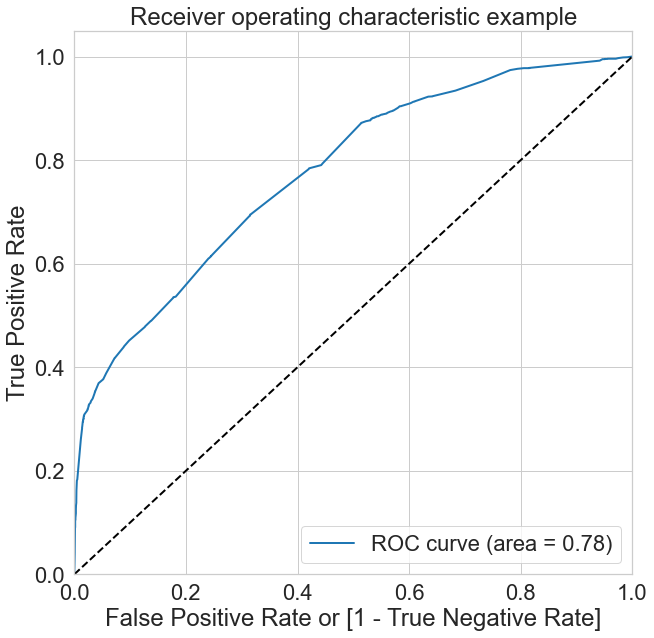

In [1369]:
draw_roc(y_train_pred_final['Converted'], y_train_pred_final['Convertion_Prob'])

## <font color = Red>Step8.a: Finding Optimal Cutoff Point</font>

Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [1370]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final['Convertion_Prob'].map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Convertion_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.386200,0,1,1,1,1,0,0,0,0,0,0
1,0,0.458754,0,1,1,1,1,1,0,0,0,0,0
2,0,0.422057,0,1,1,1,1,1,0,0,0,0,0
3,1,0.949590,1,1,1,1,1,1,1,1,1,1,1
4,0,0.334749,0,1,1,1,1,0,0,0,0,0,0


In [1371]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.379630  1.000000  0.000000
0.1   0.1  0.408977  0.995039  0.050342
0.2   0.2  0.610954  0.891277  0.439413
0.3   0.3  0.628531  0.875155  0.477612
0.4   0.4  0.702919  0.610169  0.759676
0.5   0.5  0.733522  0.369161  0.956489
0.6   0.6  0.726930  0.321207  0.975209
0.7   0.7  0.723792  0.299297  0.983557
0.8   0.8  0.722850  0.295163  0.984569
0.9   0.9  0.679535  0.162050  0.996205


<Figure size 36000x36000 with 0 Axes>

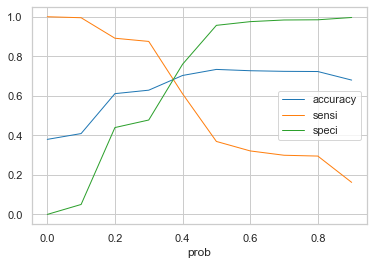

In [1372]:
# Let's plot accuracy sensitivity and specificity for various probabilities.

sns.set_style("whitegrid") 
sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 1})
plt.figure(figsize=(500,500))
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### From the curve above, 0.37 is the optimum point to take it as a cutoff probability.

In [1373]:
y_train_pred_final['predicted'] = y_train_pred_final['Convertion_Prob'].map(lambda x: 1 if x > 0.37 else 0)

# Let's see the head
y_train_pred_final.head()

,Converted,Convertion_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.386200,1,1,1,1,1,0,0,0,0,0,0
1,0,0.458754,1,1,1,1,1,1,0,0,0,0,0
2,0,0.422057,1,1,1,1,1,1,0,0,0,0,0
3,1,0.949590,1,1,1,1,1,1,1,1,1,1,1
4,0,0.334749,0,1,1,1,1,0,0,0,0,0,0


In [1374]:
from sklearn import metrics

In [1375]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final['predicted'] )
print(confusion)

[[2705 1248]
 [ 738 1681]]


In [1376]:
# Predicted--->       not_Converted    Converted
# Actual  \/
# not_Converted        2705                1248
# Converted            738                 1681  

In [1377]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final['Converted'], y_train_pred_final['predicted']))

0.6883239171374764


In [1378]:
calVIF(X_train_rfe)

,Features,VIF
1,totalVisits,2.20
6,occupation_Unemployed,2.05
8,leadOrigin_Lead Add Form,1.54
4,leadSource_Welingak Website,1.32
9,mattersWhat_Other,1.31
7,occupation_Working Professional,1.22
2,Specialiszation_Marketing Management,1.12
0,dnEmail,1.10
5,occupation_Student,1.03
3,leadSource_Referral Sites,1.02


## Metrics beyond simply accuracy

In [1379]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [1380]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.6949152542372882

In [1381]:
# Let us calculate specificity
TN / float(TN+FP)

0.6842904123450544

In [1382]:
# Calculate false postive rate - predicting Lead is not converted
print(FP/ float(TN+FP))

0.3157095876549456


In [1383]:
# positive predictive value 
print (TP / float(TP+FP))

0.5739160122908843


### Precision and Recall

In [1384]:
#Looking at the confusion matrix again

In [1385]:
confusion = metrics.confusion_matrix(y_train_pred_final['Converted'], y_train_pred_final['predicted'] )
confusion

array([[2705, 1248],
       [ 738, 1681]], dtype=int64)

##### Precision
TP / TP + FP

In [1386]:
confusion[1,1]/(confusion[0,1]+confusion[1,1])

0.5739160122908843

In [1387]:
# Using sklearn utilities for the same

In [1388]:
from sklearn.metrics import precision_score, recall_score

In [1389]:
# ?precision_score

In [1390]:
precision_score(y_train_pred_final['Converted'], y_train_pred_final['predicted'])

0.5739160122908843

In [1391]:
recall_score(y_train_pred_final['Converted'], y_train_pred_final['predicted'])

0.6949152542372882

### Precision and recall tradeoff

In [1392]:
from sklearn.metrics import precision_recall_curve

In [1393]:
y_train_pred_final['Converted'], y_train_pred_final['predicted']

(0       0
 1       0
 2       0
 3       1
 4       0
        ..
 6367    0
 6368    1
 6369    1
 6370    1
 6371    0
 Name: Converted, Length: 6372, dtype: int64,
 0       1
 1       1
 2       1
 3       1
 4       0
        ..
 6367    0
 6368    1
 6369    1
 6370    1
 6371    1
 Name: predicted, Length: 6372, dtype: int64)

In [1394]:
p, r, thresholds = precision_recall_curve(y_train_pred_final['Converted'], y_train_pred_final['Convertion_Prob'])

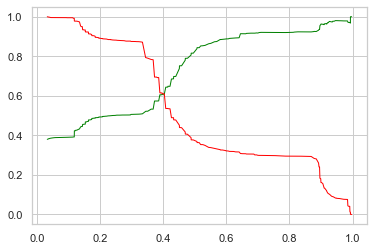

In [1395]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

## <font color = Red> Step9a: Making predictions on the test set</font>

In [1396]:
# Faetures to be scaled stored in variable
numVar = ['totalVisits',
'timeSpent',
'pgViews'
]
print(numVar)

['totalVisits', 'timeSpent', 'pgViews']


In [1397]:
# Apply scaler
df_test[numVar] = scaler.fit_transform(df_test[numVar])

### Use the same X_test and y_test

In [1398]:
df_test.head()

,dnEmail,totalVisits,timeSpent,pgViews,freeCopy,Specialiszation_Business Administration,Specialiszation_Finance Management,Specialiszation_Healthcare Management,Specialiszation_Human Resource Management,Specialiszation_IT Projects Management,...,occupation_Housewife,occupation_Other,occupation_Student,occupation_Unemployed,occupation_Working Professional,leadOrigin_Landing Page Submission,leadOrigin_Lead Add Form,leadOrigin_Lead Import,mattersWhat_Flexibility & Convenience,mattersWhat_Other
3504,0,0.176471,1.0,0.333333,1,1,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
4050,0,0.000000,0.0,0.000000,0,1,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
7201,1,0.117647,1.0,0.222222,1,0,0,1,0,0,...,0,0,0,1,0,1,0,0,0,0
1196,0,0.235294,1.0,0.444444,1,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
8219,0,0.411765,1.0,0.194444,1,0,1,0,0,0,...,0,0,0,1,0,1,0,0,0,0


In [1399]:
colTest=X_train_rfe.columns

print(colTest)

Index(['dnEmail', 'totalVisits', 'Specialiszation_Marketing Management',
       'leadSource_Referral Sites', 'leadSource_Welingak Website',
       'occupation_Student', 'occupation_Unemployed',
       'occupation_Working Professional', 'leadOrigin_Lead Add Form',
       'mattersWhat_Other'],
      dtype='object')


In [1400]:
X_test = df_test[colTest]
X_test.head()
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2731 entries, 3504 to 5826
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   dnEmail                               2731 non-null   int64  
 1   totalVisits                           2731 non-null   float64
 2   Specialiszation_Marketing Management  2731 non-null   uint8  
 3   leadSource_Referral Sites             2731 non-null   uint8  
 4   leadSource_Welingak Website           2731 non-null   uint8  
 5   occupation_Student                    2731 non-null   uint8  
 6   occupation_Unemployed                 2731 non-null   uint8  
 7   occupation_Working Professional       2731 non-null   uint8  
 8   leadOrigin_Lead Add Form              2731 non-null   uint8  
 9   mattersWhat_Other                     2731 non-null   uint8  
dtypes: float64(1), int64(1), uint8(8)
memory usage: 85.3 KB


In [1401]:
X_test_sm = sm.add_constant(X_test)
y_test_pred = res.predict(X_test_sm)
y_test_pred[:10]

3504    0.386200
4050    0.895656
7201    0.130247
1196    0.404000
8219    0.458754
8747    0.118821
9048    0.044504
6524    0.433232
7693    0.130247
8187    0.895656
dtype: float64

In [1402]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [1403]:
# Let's see the head
y_pred_1.head()

,0
3504,0.386200
4050,0.895656
7201,0.130247
1196,0.404000
8219,0.458754


In [1404]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)
y_test_df.head()

,Converted
3504,0
4050,1
7201,0
1196,0
8219,1


In [1405]:
# Appending y_test_df and y_pred_1
y_pred_finalTest = pd.concat([y_test_df, y_pred_1],axis=1)

In [1406]:
# Renaming the column 
y_pred_finalTest= y_pred_finalTest.rename(columns={ 0 : 'Convertion_Prob'})

In [1407]:
y_pred_finalTest['final_predicted'] = y_pred_finalTest['Convertion_Prob'].map(lambda x: 1 if x > 0.37 else 0)
y_pred_finalTest.head()

,Converted,Convertion_Prob,final_predicted
3504,0,0.386200,1
4050,1,0.895656,1
7201,0,0.130247,0
1196,0,0.404000,1
8219,1,0.458754,1


In [1408]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_finalTest['Converted'], y_pred_finalTest['final_predicted'])

0.694617356279751

In [1409]:
confusionTest = metrics.confusion_matrix(y_pred_finalTest['Converted'], y_pred_finalTest['final_predicted'])
confusionTest

array([[1183,  506],
       [ 328,  714]], dtype=int64)

In [1410]:
TP = confusionTest[1,1] # true positive 
TN = confusionTest[0,0] # true negatives
FP = confusionTest[0,1] # false positives
FN = confusionTest[1,0] # false negatives

In [1411]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.6852207293666027

In [1412]:
# Let us calculate specificity
TN / float(TN+FP)

0.7004144464179988

## <font color = Red> Step9.2: Model 2 Inference </font>

In [1413]:

# The Sensitivity and Specificity values are less than 5 % between the Train and Test datasets 
# The model accuracy is almost same for both Train and Test

# ===================================================================
#               |  Train                   | Test
# -------------------------------------------------------------
# Sensitivity   | 0.6949152542372882        | 0.6852207293666027
# Specificity   | 0.6842904123450544       | 0.7004144464179988
# Accuracy      | 0.6883239171374764       | 0.694617356279751
# ===================================================================


## <font color = Red> Step10: Model Selection </font>

In [1414]:
# 2 Models were built using the below 2 approaches:

# Approach 1: 
# Include all the variable and build the model using Sklearn
# Assess the model using stats model and remove the multicollinearity using the VIF
# Approach 2: 
# Remove Collinear variables 
# Build the model using Sklearn
# Assess the model using stats model and remove the multicollinearity using the VIF


# Model Metrics for each model

# Model 1
# ===================================================================
#               |  Train                   | Test
# -------------------------------------------------------------
# Sensitivity   | 0.854071930549814        | 0.8608445297504799
# Specificity   | 0.4948140652668859       | 0.5014801657785672
# Accuracy      | 0.6311989956057753       | 0.6385939216404247
# ===================================================================


# Model 2
# ===================================================================
#               |  Train                   | Test
# -------------------------------------------------------------
# Sensitivity   | 0.6949152542372882        | 0.6852207293666027
# Specificity   | 0.6842904123450544       | 0.7004144464179988
# Accuracy      | 0.6883239171374764       | 0.694617356279751
# ===================================================================



 ##  <font color = Red >  Though the accuracy of the model 2 is more than model 1 , Model 1 is still selected  as the Sensitivity is higher than that of the Model 2 </font>